# NOMAD snapshot vizualization

In [4]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean

/Users/fsudre/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [5]:
# set the date of the snapshots
year=2020
month=1
day=1

In [6]:
# set path to NOMAD folders
root_dir = '/Users/fsudre/Desktop/temp_local_files/'
# set path to dave figures
picpath = '/Users/fsudre/Desktop/'

### Import NOMAD data

In [111]:
# Med BOA
inpath= root_dir + 'BOAonMUR_MedSea_v3/'+str(year)+'/'
ncfile = 'BOAonMUR_MedSea_Y'+str(year)+'-M'+str(month)+'-D'+str(day)+'.nc'

ds_boa_med = xr.open_dataset(inpath + ncfile)
ds_boa_med.close()

In [112]:
# SWIO BOA
inpath= root_dir + 'BOAonMUR_SWIO_v3/'+str(year)+'/'
ncfile = 'BOAonMUR_SWIO_Y'+str(year)+'-M'+str(month)+'-D'+str(day)+'.nc'

ds_boa_swio = xr.open_dataset(inpath + ncfile)
ds_boa_swio.close()

In [113]:
# Med FSLE
inpath= root_dir + 'FSLEonSATA_MedSea_v3/'+str(year)+'/'
ncfile = 'FSLE_MedSea_'+str(year)+'-'+str(month)+'-'+str(day)+'.nc'

ds_fsle_med = xr.open_dataset(inpath + ncfile)
ds_fsle_med.close()

In [7]:
# SWIO FSLE
inpath= root_dir + 'FSLEonSATA_SWIO_v3/'+str(year)+'/'
ncfile = 'FSLE_SWIO_'+str(year)+'-'+str(month)+'-'+str(day)+'.nc'

ds_fsle_swio = xr.open_dataset(inpath + ncfile)
ds_fsle_swio.close()

### Set plot parameters

In [8]:
picpath='/Users/fsudre/Desktop/PROJECTS/data_paper/figures/' # path where we save the figures
region_vec = ["MedSea" , "SWIO"]  # regions of interest
var_vec = ["TG" , "FSLE"]       # variables of interest: thermal gradient (TG) or FSLE
caption_vec = ["a.","b.","c.","d."]  # fig caption
unit_dict={"TG":"°C/km", "FSLE":"day-1"}  # units of the variables 
valmax_dict={"TG": 0.06, "FSLE": 0.5}  # colorbar max values
valmin_dict={"TG": 0., "FSLE": 0.}  # colorbar min values
cmap = "turbo"    # colormap, chosen from https://matplotlib.org/stable/tutorials/colors/colormaps.html 

## Plot snapshots for both variables and regions

In [62]:
def plot_tiled_snapshot(var_of_interest, region_of_interest):
    
    val_min = valmin_dict[var_of_interest]
    val_max = valmax_dict[var_of_interest]
    caption = caption_vec[fig_index-1]
    
    # select var_of_interest where flag=0
    if fig_index==1:
        da = ds_boa_med.temp_gradient.where(ds_boa_med.flag==0)
    elif fig_index==2:
        da = ds_fsle_med.fsle.where(ds_fsle_med.flag==0)
    elif fig_index==3:
        da = ds_boa_swio.temp_gradient.where(ds_boa_swio.flag==0)
    elif fig_index==4:
        da = ds_fsle_swio.fsle.where(ds_fsle_swio.flag==0)
        
    ax = fig.add_subplot(2, 2, fig_index, projection=ccrs.PlateCarree())
    
    if region_of_interest=="SWIO":
        ax.set_extent([30, 80, -35, -5], crs=ccrs.PlateCarree()) # select area of interest
    elif region_of_interest=="MedSea":
        ax.set_extent([-6, 37, 29, 46], crs=ccrs.PlateCarree()) # select area of interest

    # add text box 
    font_title = {'color':  'black','weight': 'bold','size': 8}
    box_data_title = {'facecolor': 'white','edgecolor': 'k','boxstyle': 'square','alpha':1}
    if region_of_interest=='SWIO':
        plt.text(31, -7, caption, fontdict=font_title, bbox=box_data_title)
    elif region_of_interest=="MedSea":
        plt.text(-5, 44.6, caption, fontdict=font_title, bbox=box_data_title)
  
    # add geographic features
    ax.add_feature(cfeature.LAND.with_scale('10m'), linewidth=2, alpha=1)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linewidth=.5, alpha=0.8, linestyle='-')
    ax.coastlines(resolution='10m',linewidth=.5, alpha=1, linestyle='-')

    # set gridlines
    gl = ax.gridlines(draw_labels=True,linewidth=.2, color='gray', alpha=0.8, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False

    # background plot
    front_plot = da.plot(vmin=val_min, vmax=val_max, cmap=cmap, add_colorbar=False)

    # colorbars
    if fig_index==3:
        # cbar BOA
        val_max=valmax_dict[var_of_interest]
        cax_boa = plt.axes([0.17, -0.05, 0.2, 0.03]) #[left, bottom, width, height]
        cbar_boa = plt.colorbar(front_plot, cax=cax_boa, label=unit_dict[var_of_interest],
                                orientation='horizontal',
                                ticks=[val_min,(val_max-val_min)/2,val_max]) 
    elif fig_index==4:
        # cbar FSLE
        val_max = 0.5
        cax_fsle = plt.axes([0.67, -0.05, 0.2, 0.03]) #[left, bottom, width, height]
        cbar_fsle = plt.colorbar(front_plot, cax=cax_fsle, label=unit_dict[var_of_interest],
                                 orientation='horizontal',
                                 ticks=[val_min,(val_max-val_min)/2,val_max]) 

    # empty title
    ax.set_title('')

/var/folders/44/_6b7fsl93dbdvwyjr8vf470m0000gp/T/ipykernel_22620/4281213495.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


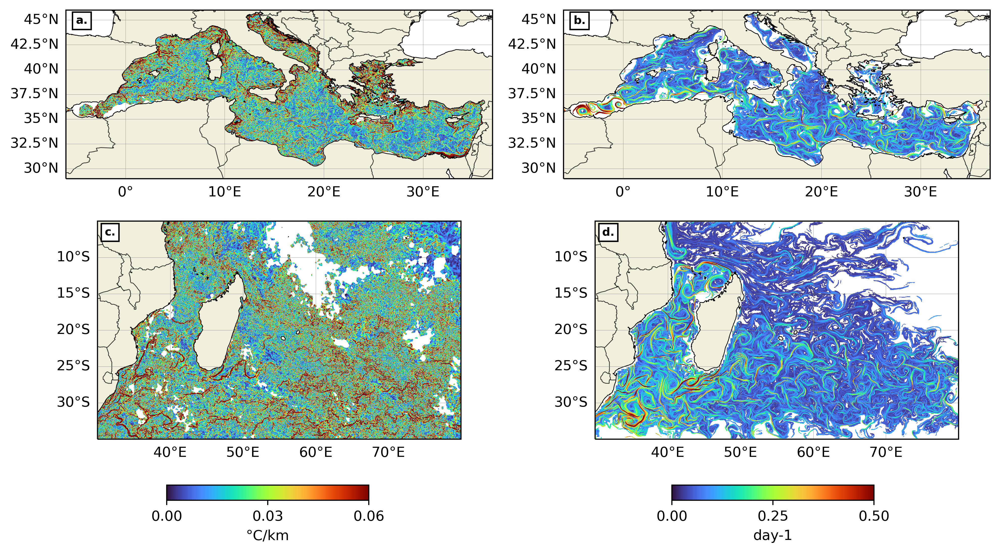

In [63]:
fig = plt.figure(dpi=400,figsize=(10,5))
fig_index=1

for region_of_interest in region_vec:
    for var_of_interest in var_vec:
        plot_tiled_snapshot(var_of_interest, region_of_interest)
        fig_index=fig_index+1
    
plt.tight_layout()
# Save figure
plt.savefig(picpath + 'NOMAD_snapshots_'+str(year)+'-'+str(month)+'-'+str(day)+'.jpg', bbox_inches='tight')

## Plot just one snapshot  -- no thresholding

In [9]:
def plot_1_snapshot(var_of_interest, region_of_interest):
    
    val_min = valmin_dict[var_of_interest]
    val_max = valmax_dict[var_of_interest]
    
    if var_of_interest=="TG":
        if region_of_interest=="MedSea":
            da = ds_boa_med.temp_gradient.where(ds_boa_med.flag==0)
        elif region_of_interest=="SWIO":
            da = ds_boa_swio.temp_gradient.where(ds_boa_swio.flag==0)
    elif var_of_interest=="FSLE":
        if region_of_interest=="MedSea":
            da = ds_fsle_med.fsle.where(ds_fsle_med.flag==0)
        elif region_of_interest=="SWIO":
            da = ds_fsle_swio.fsle.where(ds_fsle_swio.flag==0)
        
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    
    if region_of_interest=="SWIO":
        ax.set_extent([30, 80, -35, -5], crs=ccrs.PlateCarree()) # select area of interest
    elif region_of_interest=="MedSea":
        ax.set_extent([-6, 37, 29, 46], crs=ccrs.PlateCarree()) # select area of interest

    # add text box with date
    date = str(year)+'-'+str(month)+'-'+str(day)
    font_title = {'color':  'black','weight': 'bold','size': 8}
    box_data_title = {'facecolor': 'white','edgecolor': 'k','boxstyle': 'square','alpha':1}
    if region_of_interest=='SWIO':
        plt.text(31, -7, date, fontdict=font_title, bbox=box_data_title)
    elif region_of_interest=="MedSea":
        plt.text(-5, 44.6, date, fontdict=font_title, bbox=box_data_title)
  
    # add geographic features
    ax.add_feature(cfeature.LAND.with_scale('10m'), linewidth=2, alpha=1)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linewidth=.5, alpha=0.8, linestyle='-')
    ax.coastlines(resolution='10m',linewidth=.5, alpha=1, linestyle='-')

    # set gridlines
    gl = ax.gridlines(draw_labels=True,linewidth=.2, color='gray', alpha=0.8, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False

    # background plot
    front_plot = da.plot(vmin=val_min, vmax=val_max, cmap=cmap, add_colorbar=True, 
                         cbar_kwargs={"orientation":'horizontal',"label": unit_dict[var_of_interest], 
                                      "pad":0.06,"shrink":0.7})

    # empty title
    ax.set_title('')

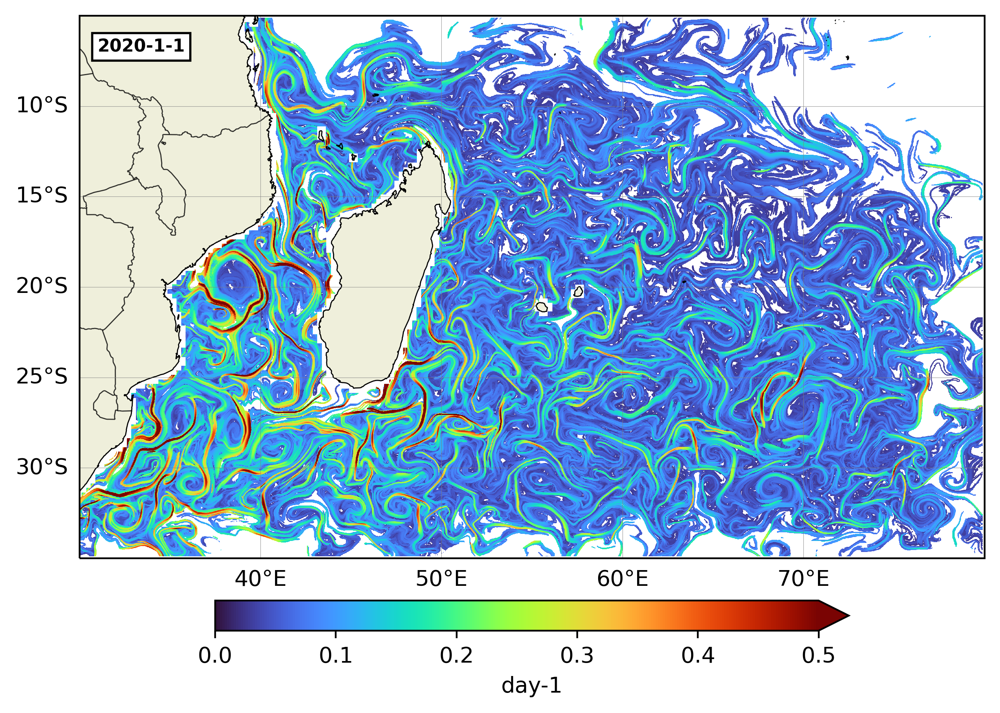

In [10]:
fig = plt.figure(dpi=400)
variable_of_interest="FSLE"
region_of_interest="SWIO"

plot_1_snapshot(variable_of_interest,region_of_interest)
    
plt.tight_layout()

# Save figure
picname = 'NOMAD_'+variable_of_interest+'on'+region_of_interest+'_'+str(year)+'-'+str(month)+'-'+str(day)+'.jpg'
plt.savefig(picpath + picname, bbox_inches='tight')

## Plot one snapshot -- with thresholding

In [102]:
def plot_1_thresholded_snapshot(var_of_interest, region_of_interest):
    
    val_min = valmin_dict[var_of_interest]
    val_max = valmax_dict[var_of_interest]
    
    if var_of_interest=="TG":
        if region_of_interest=="MedSea":
            da = ds_boa_med.temp_gradient.where(ds_boa_med.flag==0).where(ds_boa_med.temp_gradient>=ds_boa_med.threshold_MedSea)
        elif region_of_interest=="SWIO":
            da = ds_boa_swio.temp_gradient.where(ds_boa_swio.flag==0).where(ds_boa_swio.temp_gradient>=ds_boa_swio.threshold_SWIO)
    elif var_of_interest=="FSLE":
        if region_of_interest=="MedSea":
            da = ds_fsle_med.fsle.where(ds_fsle_med.flag==0).where(ds_fsle_med.fsle>=ds_fsle_med.threshold_MedSea)
        elif region_of_interest=="SWIO":
            da = ds_fsle_swio.fsle.where(ds_fsle_swio.flag==0).where(ds_fsle_swio.fsle>=ds_fsle_swio.threshold_SWIO)
        
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    
    if region_of_interest=="SWIO":
        ax.set_extent([30, 80, -35, -5], crs=ccrs.PlateCarree()) # select area of interest
    elif region_of_interest=="MedSea":
        ax.set_extent([-6, 37, 29, 46], crs=ccrs.PlateCarree()) # select area of interest

    # add text box with date
    date = str(year)+'-'+str(month)+'-'+str(day)
    font_title = {'color':  'black','weight': 'bold','size': 8}
    box_data_title = {'facecolor': 'white','edgecolor': 'k','boxstyle': 'square','alpha':1}
    if region_of_interest=='SWIO':
        plt.text(31, -7, date, fontdict=font_title, bbox=box_data_title)
    elif region_of_interest=="MedSea":
        plt.text(-5, 44.6, date, fontdict=font_title, bbox=box_data_title)
  
    # add geographic features
    ax.add_feature(cfeature.LAND.with_scale('10m'), linewidth=2, alpha=1)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'),linewidth=.5, alpha=0.8, linestyle='-')
    ax.coastlines(resolution='10m',linewidth=.5, alpha=1, linestyle='-')

    # set gridlines
    gl = ax.gridlines(draw_labels=True,linewidth=.2, color='gray', alpha=0.8, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False

    # background plot
    front_plot = da.plot(vmin=val_min, vmax=val_max, cmap="Blues", add_colorbar=True, 
                         cbar_kwargs={"orientation":'horizontal',"label": unit_dict[var_of_interest], 
                                      "pad":0.06,"shrink":0.7})

    # empty title
    ax.set_title('')

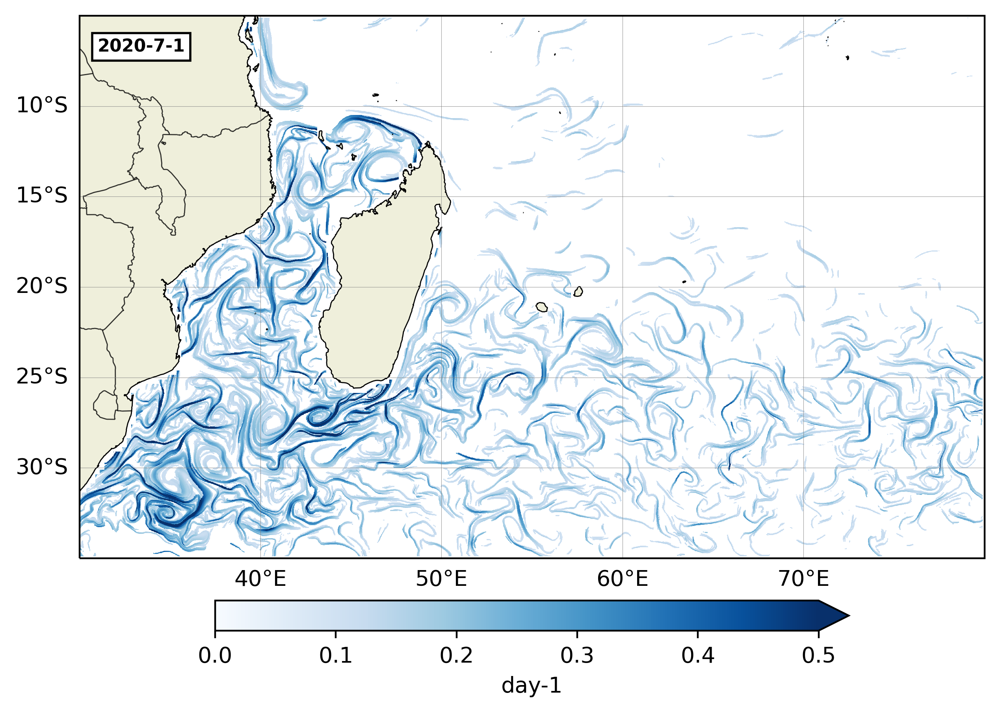

In [105]:
fig = plt.figure(dpi=400)
variable_of_interest="FSLE"
region_of_interest="SWIO"

plot_1_thresholded_snapshot(variable_of_interest,region_of_interest)
    
plt.tight_layout()

# Save figure
picname = 'NOMAD_thresholded_'+variable_of_interest+'on'+region_of_interest+'_'+str(year)+'-'+str(month)+'-'+str(day)+'.jpg',
plt.savefig(picpath + picname,  bbox_inches='tight')